In [272]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://www.thecolosseum.org/wp-content/uploads/colosseum-banner.jpg")

Image credits: https://www.thecolosseum.org/

# Airbnb Rome 2023

#### Website: [Inside Airbnb](http://insideairbnb.com/)
#### Data source: http://insideairbnb.com/get-the-data/
#### Credits to: Inside Airbnb Team and it collaborators - http://insideairbnb.com/about/

In [3]:
# Importing libraries

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action="ignore",category=FutureWarning)
import datetime as dt
pd.options.mode.chained_assignment = None

In [4]:
# Importing Data

filepath1="listings.csv.gz"
df_listings=pd.read_csv(filepath1)

filepath2="calendar.csv.gz"
df_calendar=pd.read_csv(filepath2,dtype={"adjusted_price":str})

filepath3="reviews.csv.gz"
df_reviews=pd.read_csv(filepath3)

### 1. Exploring Data

In [5]:
df_listings.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2737,https://www.airbnb.com/rooms/2737,20231215032808,2023-12-15,city scrape,Place to stay in Rome · ★4.80 · 1 bedroom · 1 ...,NaN,It used to be an industrial area until late 80...,https://a0.muscache.com/pictures/41225252/e955...,3047,...,5.00,4.40,4.40,NaN,f,6,0,6,0,0.05
1,3079,https://www.airbnb.com/rooms/3079,20231215032808,2023-12-16,previous scrape,Rental unit in Rome · ★4.53 · 1 bedroom · 1 be...,NaN,Monti neighborhood is one of the best areas in...,https://a0.muscache.com/pictures/miso/Hosting-...,3504,...,4.86,4.81,4.43,NaN,f,6,6,0,0,0.13
2,11834,https://www.airbnb.com/rooms/11834,20231215032808,2023-12-15,city scrape,Rental unit in Rome · ★4.83 · 1 bedroom · 1 be...,NaN,"""Monti"" with its narrow cobblestone alleys, cr...",https://a0.muscache.com/pictures/miso/Hosting-...,44552,...,4.95,4.99,4.77,NaN,f,1,1,0,0,1.43
3,75474,https://www.airbnb.com/rooms/75474,20231215032808,2023-12-15,city scrape,Villa in Rome · 9 bedrooms · 10 beds · 6.5 baths,NaN,"Bel Poggio is a green hill, with beautiful tre...",https://a0.muscache.com/pictures/miso/Hosting-...,400717,...,5.00,5.00,5.00,NaN,t,1,1,0,0,0.31
4,12398,https://www.airbnb.com/rooms/12398,20231215032808,2023-12-15,city scrape,Rental unit in Rome · ★4.92 · 2 bedrooms · 3 b...,NaN,You are at 15 minutes walking distance from hi...,https://a0.muscache.com/pictures/miso/Hosting-...,11756,...,5.00,4.87,4.85,NaN,f,1,1,0,0,0.41


In [6]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,230295,2023-12-15,f,$75.00,NaN,2.0,1125.0
1,230295,2023-12-16,t,$75.00,NaN,2.0,1125.0
2,230295,2023-12-17,t,$75.00,NaN,2.0,1125.0
3,230295,2023-12-18,t,$75.00,NaN,2.0,1125.0
4,230295,2023-12-19,t,$75.00,NaN,2.0,1125.0


In [7]:
df_reviews.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2737,24343517,2014-12-26,24333039,Raphaell,"This spot was in a great and nice area,walking..."
1,2737,24966779,2015-01-04,10493776,Ia,"Elif was really very helpful, while arranging ..."
2,2737,29770086,2015-04-12,29630601,Julia,"Elif's flat is spacious, clean, and had everyt..."
3,2737,30477570,2015-04-22,31215535,Sevil,I had a wonderful time staying with Elif and h...
4,2737,31659336,2015-05-08,1959813,Suzy,"Elif was a brilliant host, with an exceptional..."


### 2. Cleaning up the Data!

#### 2.1 Cleaning listing df

In [8]:
df_listings.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2737,https://www.airbnb.com/rooms/2737,20231215032808,2023-12-15,city scrape,Place to stay in Rome · ★4.80 · 1 bedroom · 1 ...,NaN,It used to be an industrial area until late 80...,https://a0.muscache.com/pictures/41225252/e955...,3047,...,5.00,4.40,4.40,NaN,f,6,0,6,0,0.05
1,3079,https://www.airbnb.com/rooms/3079,20231215032808,2023-12-16,previous scrape,Rental unit in Rome · ★4.53 · 1 bedroom · 1 be...,NaN,Monti neighborhood is one of the best areas in...,https://a0.muscache.com/pictures/miso/Hosting-...,3504,...,4.86,4.81,4.43,NaN,f,6,6,0,0,0.13
2,11834,https://www.airbnb.com/rooms/11834,20231215032808,2023-12-15,city scrape,Rental unit in Rome · ★4.83 · 1 bedroom · 1 be...,NaN,"""Monti"" with its narrow cobblestone alleys, cr...",https://a0.muscache.com/pictures/miso/Hosting-...,44552,...,4.95,4.99,4.77,NaN,f,1,1,0,0,1.43


In [9]:
df_listings.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [10]:
df_listings=df_listings[['last_scraped', 'id','latitude','longitude','host_name','neighbourhood_cleansed', 'room_type','price','minimum_nights','review_scores_rating','review_scores_accuracy','review_scores_cleanliness', 
'review_scores_checkin','review_scores_communication', 'review_scores_location','review_scores_value','number_of_reviews']]

In [11]:
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,number_of_reviews
0,2023-12-15,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,$50.00,7,4.80,4.60,4.60,4.80,5.00,4.40,4.40,5
1,2023-12-16,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.53,4.38,4.62,4.71,4.86,4.81,4.43,21
2,2023-12-15,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.83,4.83,4.91,4.98,4.95,4.99,4.77,220
3,2023-12-15,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,5.00,5.00,5.00,5.00,5.00,5.00,2
4,2023-12-15,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,4.89,4.94,4.95,5.00,4.87,4.85,66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,$60.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
29353,2023-12-15,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
29354,2023-12-16,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,$50.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
29355,2023-12-16,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,$340.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [12]:

df_listings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29357 entries, 0 to 29356
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   last_scraped                 29357 non-null  object 
 1   id                           29357 non-null  int64  
 2   latitude                     29357 non-null  float64
 3   longitude                    29357 non-null  float64
 4   host_name                    29348 non-null  object 
 5   neighbourhood_cleansed       29357 non-null  object 
 6   room_type                    29357 non-null  object 
 7   price                        27381 non-null  object 
 8   minimum_nights               29357 non-null  int64  
 9   review_scores_rating         25115 non-null  float64
 10  review_scores_accuracy       25108 non-null  float64
 11  review_scores_cleanliness    25110 non-null  float64
 12  review_scores_checkin        25108 non-null  float64
 13  review_scores_co

In [13]:
df_listings["latitude"]= df_listings["latitude"].astype(str)
df_listings["longitude"]= df_listings["longitude"].astype(str)

In [14]:
# Defining a Global Score

floatnumbers=df_listings.select_dtypes(include=float)
df_listings["Global Score"]= floatnumbers.mean(axis=1).round(2)
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,number_of_reviews,Global Score
0,2023-12-15,2737,41.87136,12.48215,Elif,VIII Appia Antica,Private room,$50.00,7,4.80,4.60,4.60,4.80,5.00,4.40,4.40,5,4.66
1,2023-12-16,3079,41.895,12.49117,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.53,4.38,4.62,4.71,4.86,4.81,4.43,21,4.62
2,2023-12-15,11834,41.89544677734375,12.491181373596191,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.83,4.83,4.91,4.98,4.95,4.99,4.77,220,4.89
3,2023-12-15,75474,41.98959,12.52154,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,5.00,5.00,5.00,5.00,5.00,5.00,2,5.00
4,2023-12-15,12398,41.92582,12.46928,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,4.89,4.94,4.95,5.00,4.87,4.85,66,4.92
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.87626,12.48731,Matteo,I Centro Storico,Entire home/apt,$60.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
29353,2023-12-15,1045689020966629799,41.9101668,12.4547101,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
29354,2023-12-16,1045768413893531664,41.87458,12.48066,Malina Maria,VIII Appia Antica,Private room,$50.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN
29355,2023-12-16,1046232189823053817,41.88890643236729,12.472012596010371,Weekey,I Centro Storico,Entire home/apt,$340.00,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN


In [15]:
df_listings.columns

Index(['last_scraped', 'id', 'latitude', 'longitude', 'host_name',
       'neighbourhood_cleansed', 'room_type', 'price', 'minimum_nights',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'number_of_reviews', 'Global Score'],
      dtype='object')

In [16]:
df_listings=df_listings[['last_scraped', 'id', 'latitude', 'longitude', 'host_name',
       'neighbourhood_cleansed', 'room_type', 'price', 'minimum_nights',
        'Global Score','number_of_reviews']]

In [17]:
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,Global Score,number_of_reviews
0,2023-12-15,2737,41.87136,12.48215,Elif,VIII Appia Antica,Private room,$50.00,7,4.66,5
1,2023-12-16,3079,41.895,12.49117,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.62,21
2,2023-12-15,11834,41.89544677734375,12.491181373596191,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.89,220
3,2023-12-15,75474,41.98959,12.52154,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,2
4,2023-12-15,12398,41.92582,12.46928,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,66
...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.87626,12.48731,Matteo,I Centro Storico,Entire home/apt,$60.00,1,NaN,0
29353,2023-12-15,1045689020966629799,41.9101668,12.4547101,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,NaN,0
29354,2023-12-16,1045768413893531664,41.87458,12.48066,Malina Maria,VIII Appia Antica,Private room,$50.00,1,NaN,0
29355,2023-12-16,1046232189823053817,41.88890643236729,12.472012596010371,Weekey,I Centro Storico,Entire home/apt,$340.00,1,NaN,0


In [18]:
df_listings["Global Score"]= df_listings["Global Score"].fillna(0)

In [19]:
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,Global Score,number_of_reviews
0,2023-12-15,2737,41.87136,12.48215,Elif,VIII Appia Antica,Private room,$50.00,7,4.66,5
1,2023-12-16,3079,41.895,12.49117,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.62,21
2,2023-12-15,11834,41.89544677734375,12.491181373596191,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.89,220
3,2023-12-15,75474,41.98959,12.52154,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,2
4,2023-12-15,12398,41.92582,12.46928,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,66
...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.87626,12.48731,Matteo,I Centro Storico,Entire home/apt,$60.00,1,0.00,0
29353,2023-12-15,1045689020966629799,41.9101668,12.4547101,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,0.00,0
29354,2023-12-16,1045768413893531664,41.87458,12.48066,Malina Maria,VIII Appia Antica,Private room,$50.00,1,0.00,0
29355,2023-12-16,1046232189823053817,41.88890643236729,12.472012596010371,Weekey,I Centro Storico,Entire home/apt,$340.00,1,0.00,0


In [20]:
df_listings["last_scraped"]= pd.to_datetime(df_listings["last_scraped"])

In [21]:
df_listings["latitude"]=df_listings["latitude"].astype(float)
df_listings["longitude"]=df_listings["longitude"].astype(float)

In [22]:
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,Global Score,number_of_reviews
0,2023-12-15,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,$50.00,7,4.66,5
1,2023-12-16,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.62,21
2,2023-12-15,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.89,220
3,2023-12-15,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,2
4,2023-12-15,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,66
...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,$60.00,1,0.00,0
29353,2023-12-15,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,0.00,0
29354,2023-12-16,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,$50.00,1,0.00,0
29355,2023-12-16,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,$340.00,1,0.00,0


#### 2.2 Cleaning Calendar Table

In [23]:
df_calendar

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,230295,2023-12-15,f,$75.00,NaN,2.0,1125.0
1,230295,2023-12-16,t,$75.00,NaN,2.0,1125.0
2,230295,2023-12-17,t,$75.00,NaN,2.0,1125.0
3,230295,2023-12-18,t,$75.00,NaN,2.0,1125.0
4,230295,2023-12-19,t,$75.00,NaN,2.0,1125.0
...,...,...,...,...,...,...,...
10717519,322226,2024-12-09,f,$195.00,NaN,7.0,180.0
10717520,322226,2024-12-10,f,$195.00,NaN,7.0,180.0
10717521,322226,2024-12-11,f,$195.00,NaN,7.0,180.0
10717522,322226,2024-12-12,f,$195.00,NaN,7.0,180.0


In [24]:
df_calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10717524 entries, 0 to 10717523
Data columns (total 7 columns):
 #   Column          Dtype  
---  ------          -----  
 0   listing_id      int64  
 1   date            object 
 2   available       object 
 3   price           object 
 4   adjusted_price  object 
 5   minimum_nights  float64
 6   maximum_nights  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 572.4+ MB


In [25]:
df_calendar= df_calendar[["listing_id","price"]]

In [26]:
df_calendar

,listing_id,price
0,230295,$75.00
1,230295,$75.00
2,230295,$75.00
3,230295,$75.00
4,230295,$75.00
...,...,...
10717519,322226,$195.00
10717520,322226,$195.00
10717521,322226,$195.00
10717522,322226,$195.00


In [27]:
df_calendar["price"]= df_calendar["price"].str.replace("$","")

In [28]:
df_calendar

,listing_id,price
0,230295,75.00
1,230295,75.00
2,230295,75.00
3,230295,75.00
4,230295,75.00
...,...,...
10717519,322226,195.00
10717520,322226,195.00
10717521,322226,195.00
10717522,322226,195.00


In [29]:
import locale
locale.setlocale(locale.LC_ALL,'en_US.UTF-8')

'en_US.UTF-8'

In [30]:
df_calendar["price"]= df_calendar["price"].apply(locale.atof)
df_calendar

,listing_id,price
0,230295,75.0
1,230295,75.0
2,230295,75.0
3,230295,75.0
4,230295,75.0
...,...,...
10717519,322226,195.0
10717520,322226,195.0
10717521,322226,195.0
10717522,322226,195.0


In [31]:
df_calendar= df_calendar.groupby(["listing_id"],as_index=False)["price"].max()
df_calendar

,listing_id,price
0,2737,40.0
1,3079,120.0
2,11834,85.0
3,12398,85.0
4,19965,75.0
...,...,...
29352,1045686898188445060,256.0
29353,1045689020966629799,400.0
29354,1045768413893531664,50.0
29355,1046232189823053817,130.0


In [32]:
df_calendar.rename(columns=({"listing_id":"id"}),inplace=True)

In [33]:
# Updating to the most recent price for each id 
df_calendar

,id,price
0,2737,40.0
1,3079,120.0
2,11834,85.0
3,12398,85.0
4,19965,75.0
...,...,...
29352,1045686898188445060,256.0
29353,1045689020966629799,400.0
29354,1045768413893531664,50.0
29355,1046232189823053817,130.0


#### 2.3 Cleaning reviews table

In [34]:
df_reviews

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2737,24343517,2014-12-26,24333039,Raphaell,"This spot was in a great and nice area,walking..."
1,2737,24966779,2015-01-04,10493776,Ia,"Elif was really very helpful, while arranging ..."
2,2737,29770086,2015-04-12,29630601,Julia,"Elif's flat is spacious, clean, and had everyt..."
3,2737,30477570,2015-04-22,31215535,Sevil,I had a wonderful time staying with Elif and h...
4,2737,31659336,2015-05-08,1959813,Suzy,"Elif was a brilliant host, with an exceptional..."
...,...,...,...,...,...,...
1621357,1039095596324553445,1044119130542985213,2023-12-11,128872305,Nando,Ottimo
1621358,1039214207343958639,1045530091261278353,2023-12-13,52567098,Renzo,"Paola è un host gentile e presente, disponibil..."
1621359,1039631900251985277,1044127171133498981,2023-12-11,68156149,Erin,"My mom and I booked this on a last minute, une..."
1621360,1039728330307491083,1042599778426642801,2023-12-09,549871691,Hazel Marie,Satisfied costumer here! if we can give more t...


In [35]:
df_reviews= df_reviews[["listing_id","date","comments"]]

In [36]:
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1621362 entries, 0 to 1621361
Data columns (total 3 columns):
 #   Column      Non-Null Count    Dtype 
---  ------      --------------    ----- 
 0   listing_id  1621362 non-null  int64 
 1   date        1621362 non-null  object
 2   comments    1621264 non-null  object
dtypes: int64(1), object(2)
memory usage: 37.1+ MB


In [37]:
df_reviews.rename(columns=({"listing_id":"id"}),inplace=True)

In [38]:
df_reviews["date"]= pd.to_datetime(df_reviews["date"])

In [39]:
df_reviews

,id,date,comments
0,2737,2014-12-26,"This spot was in a great and nice area,walking..."
1,2737,2015-01-04,"Elif was really very helpful, while arranging ..."
2,2737,2015-04-12,"Elif's flat is spacious, clean, and had everyt..."
3,2737,2015-04-22,I had a wonderful time staying with Elif and h...
4,2737,2015-05-08,"Elif was a brilliant host, with an exceptional..."
...,...,...,...
1621357,1039095596324553445,2023-12-11,Ottimo
1621358,1039214207343958639,2023-12-13,"Paola è un host gentile e presente, disponibil..."
1621359,1039631900251985277,2023-12-11,"My mom and I booked this on a last minute, une..."
1621360,1039728330307491083,2023-12-09,Satisfied costumer here! if we can give more t...


#### 2.4 Merging listings and calendar tables

In [40]:
df_listings

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,price,minimum_nights,Global Score,number_of_reviews
0,2023-12-15,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,$50.00,7,4.66,5
1,2023-12-16,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,$120.00,30,4.62,21
2,2023-12-15,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,$107.00,2,4.89,220
3,2023-12-15,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,"$1,973.00",3,5.00,2
4,2023-12-15,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,$102.00,1,4.92,66
...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,$60.00,1,0.00,0
29353,2023-12-15,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,$68.00,2,0.00,0
29354,2023-12-16,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,$50.00,1,0.00,0
29355,2023-12-16,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,$340.00,1,0.00,0


In [41]:
del df_listings["price"]

In [42]:
df_calendar

,id,price
0,2737,40.0
1,3079,120.0
2,11834,85.0
3,12398,85.0
4,19965,75.0
...,...,...
29352,1045686898188445060,256.0
29353,1045689020966629799,400.0
29354,1045768413893531664,50.0
29355,1046232189823053817,130.0


In [43]:
df=pd.merge(left=df_listings,right=df_calendar,on="id",how="left")
df

,last_scraped,id,latitude,longitude,host_name,neighbourhood_cleansed,room_type,minimum_nights,Global Score,number_of_reviews,price
0,2023-12-15,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0
1,2023-12-16,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0
2,2023-12-15,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0
3,2023-12-15,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,3,5.00,2,1700.0
4,2023-12-15,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0
...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0
29353,2023-12-15,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0
29354,2023-12-16,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0
29355,2023-12-16,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0


In [44]:
df.rename(columns=({"neighbourhood_cleansed":"neighbourhood"}),inplace=True)

### 3. Analyse Data

In [45]:
airbnb=df.copy()
calendar=df_calendar.copy()

In [46]:
airbnb.insert(1,"year","")

In [47]:
airbnb["year"]=airbnb["last_scraped"].dt.year
airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0
3,2023-12-15,2023,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,3,5.00,2,1700.0
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0
...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0


In [48]:
airbnb["price"].describe()

count    29357.000000
mean       215.718738
std       1014.731899
min          3.000000
25%         70.000000
50%        110.000000
75%        180.000000
max      90963.000000
Name: price, dtype: float64

The above output describes the metrics for price ranges in the whole Rome area

Im going to categorized the listings based on whether they fall into specific price ranges.

- Budget
- Average
- Expensive
- Outlier

<Axes: >

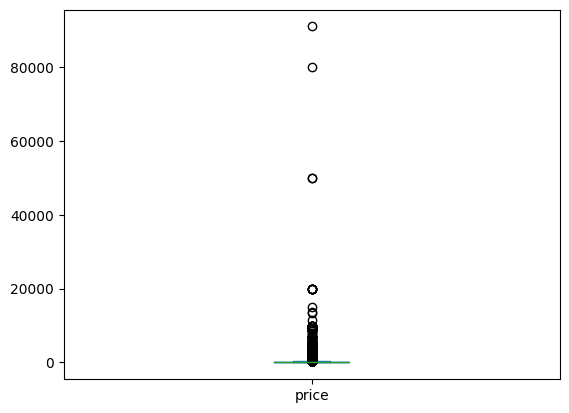

In [49]:
airbnb["price"].plot(kind="box")

Some prices are extremely high, for example the max price for an accommodation is $90.963,00 per night.

Considering some prices spikes beyond the average of the entire population data, will be better to consider those as an "Anomaly or Outliers"

According to [Techtarget](https://www.techtarget.com/whatis/definition/outlier#:~:text=An%20outlier%20is%20a%20single,samples%20of%20populations%20as%20well.), "An outlier is a single data point that goes far outside the average value of a group of statistics. Outliers may be exceptions that stand outside individual samples of populations as well."

Another definition from [wikipedia](https://en.wikipedia.org/wiki/Anomaly_detection), "In data analysis, anomaly detection (also referred to as outlier detection and sometimes as novelty detection) is generally understood to be the identification of rare items, events or observations which deviate significantly from the majority of the data and do not conform to a well defined notion of normal behaviour."

These anomialies can also be explained as some  kind of malfunctions on Airbnb servers, as being reported by some users on the Airbnb community section: 

- "Prezzi sbagliati"-> [link](https://community.withairbnb.com/t5/Supporto/prezzi-sbagliati/m-p/205966)
- "Listing shows with wrong price"-> [link](https://community.withairbnb.com/t5/Help/LISTING-SHOWS-WITH-WRONG-TOO-HIGH-PRICE/td-p/12131)


In [50]:
airbnb["price"].describe()

count    29357.000000
mean       215.718738
std       1014.731899
min          3.000000
25%         70.000000
50%        110.000000
75%        180.000000
max      90963.000000
Name: price, dtype: float64

In [51]:
label_names=["Budget","Average","Expensive","Extravagant","Outlier"]
price_ranges=[0,70,216,900,1000,np.inf]

airbnb["price_category"]=pd.cut(airbnb["price"],bins=price_ranges,labels=label_names)
airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_category
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0,Budget
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0,Average
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0,Average
3,2023-12-15,2023,75474,41.989590,12.521540,Marina,III Monte Sacro,Entire home/apt,3,5.00,2,1700.0,Outlier
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0,Average
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0,Expensive
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0,Expensive
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0,Budget
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0,Average


In [52]:
# Ruling out Outliers

filter=airbnb["price_category"]!="Outlier"
airbnb=airbnb[filter]

In [53]:
airbnb["price"].describe()

count    28967.000000
mean       155.730590
std        151.046834
min          3.000000
25%         70.000000
50%        110.000000
75%        180.000000
max       1000.000000
Name: price, dtype: float64

In [54]:
# Relabiling price category once more

label_names=["Budget","Average","Expensive","Extravagant"]
price_ranges=[0,150,156,900,np.inf]

airbnb["price_category"]=pd.cut(airbnb["price"],bins=price_ranges,labels=label_names)
airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_category
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0,Budget
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0,Budget
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0,Budget
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0,Budget
5,2023-12-15,2023,77831,41.897330,12.491700,Nathalie,I Centro Storico,Entire home/apt,3,4.89,310,110.0,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0,Expensive
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0,Expensive
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0,Budget
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0,Budget


#### 3.1 How many accommodations were in Rome in 2023?

In [55]:
print(f"There was {airbnb.shape[0]} accommodations listed in 2023")

There was 28967 accommodations listed in 2023


#### 3.2 What is the average price per night, of an Airbnb listed in Rome?

In [56]:
average_night=airbnb["price"].mean()
print(f"The average price per night for an Airbnb accommodation in Rome is ${average_night.round(2)}")

The average price per night for an Airbnb accommodation in Rome is $155.73


#### 3.3 How does the average price of an Airbnb listed in Rome per month compared to the private rental market?

knowing how much costs an acommodation per night in Rome, would be useful to have a benchmark for comparison.

According to [housinganywhere](https://housinganywhere.com/Rome--Italy/cost-of-living-rome), a 1 bedroom apartment in Rome City costs, on average, $1.650 per month.

In [57]:
# Im going to add price per month column by converting the per night prices of the listings into monthly costs, so I can compare to the private market.

airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_category
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0,Budget
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0,Budget
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0,Budget
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0,Budget
5,2023-12-15,2023,77831,41.897330,12.491700,Nathalie,I Centro Storico,Entire home/apt,3,4.89,310,110.0,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0,Expensive
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0,Expensive
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0,Budget
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0,Budget


In [58]:
airbnb.columns.get_loc("price")

11

In [59]:
airbnb.insert(12,"price_month","")

In [60]:
airbnb= airbnb.assign(price_month=lambda x:((df["price"]*365/12).round(2)))

In [61]:
average_month=airbnb["price_month"].mean().round(2)
print(f"An Airbnb per month in Rome costs: ${average_month}, while in the private market you would pay $1.650,00")

An Airbnb per month in Rome costs: $4736.81, while in the private market you would pay $1.650,00


These prices are just the average rental prices across Rome, depending on the Roman neighborhood.

#### 3.4 How many Airbnb room types are listed?

In [62]:
room_types=airbnb.groupby(["room_type"],as_index=False)["id"].count().rename(columns=({"id":"total"}))
room_types

,room_type,total
0,Entire home/apt,20420
1,Hotel room,595
2,Private room,7808
3,Shared room,144


In [63]:
room_types=room_types.assign(market_share=lambda x:(room_types["total"]/airbnb.shape[0]*100)).round(2)
room_types

,room_type,total,market_share
0,Entire home/apt,20420,70.49
1,Hotel room,595,2.05
2,Private room,7808,26.95
3,Shared room,144,0.50


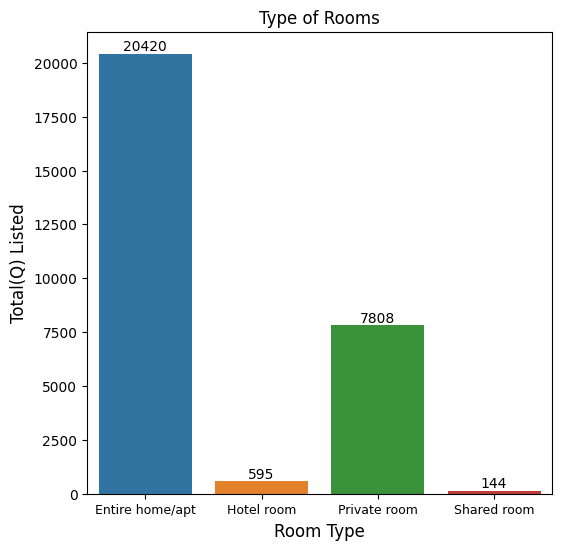

In [64]:
plt.figure(figsize=(6,6))
ax=sns.barplot(x="room_type",y="total",data=room_types,hue="room_type",legend=False)
for bars in ax.containers:
    ax.bar_label(bars)
plt.title("Type of Rooms")
plt.xlabel("Room Type",fontsize=12)
plt.ylabel("Total(Q) Listed",fontsize=12)
plt.xticks(rotation=0,size=9)
plt.show()

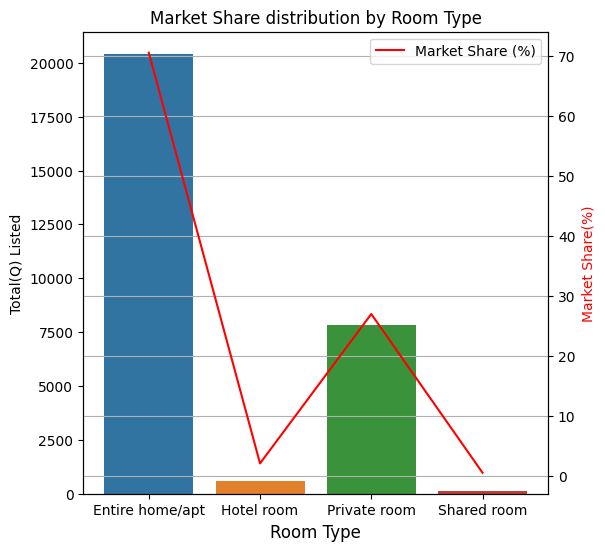

In [65]:
fig=plt.figure(figsize=(6,6))
ax1=sns.barplot(x="room_type",y="total",hue="room_type",palette="tab10",data=room_types)
plt.xticks(rotation=0,size=10)
plt.xlabel("Room Type",fontsize=12)
plt.ylabel("Total(Q) Listed")
ax2=ax1.twinx()
ax2=sns.lineplot(x="room_type",y="market_share",data=room_types,label="Market Share (%)",color="r")
plt.ylabel("Market Share(%)",color="r")
plt.title("Market Share distribution by Room Type")
plt.grid()
plt.show()

In [66]:
f"There are {airbnb.shape[0]} accomodations listed in Rome. The Entire home/apt holds most part of the market share with {round((20420/airbnb.shape[0]*100),2)}% "

'There are 28967 accomodations listed in Rome. The Entire home/apt holds most part of the market share with 70.49% '

#### 3.5 How do Airbnb listing prices compare across the different neighbourhoods in Rome?

In [67]:
airbnb.groupby(["neighbourhood"],as_index=False)["price"].agg(["min","max","mean"])

,neighbourhood,min,max,mean
0,I Centro Storico,9.0,1000.0,190.681671
1,II Parioli/Nomentano,10.0,1000.0,134.805662
2,III Monte Sacro,10.0,999.0,107.456311
3,IV Tiburtina,11.0,1000.0,106.812741
4,IX Eur,3.0,900.0,125.123324
5,V Prenestino/Centocelle,10.0,997.0,84.890995
6,VI Roma delle Torri,11.0,800.0,73.242754
7,VII San Giovanni/Cinecittà,11.0,1000.0,114.395242
8,VIII Appia Antica,12.0,1000.0,118.161483
9,X Ostia/Acilia,18.0,1000.0,104.383375


In [68]:
boroughs=airbnb.groupby(["neighbourhood"],as_index=False)["price"].mean().round(2).sort_values("price",ascending=False)
boroughs

,neighbourhood,price
0,I Centro Storico,190.68
12,XIII Aurelia,137.20
1,II Parioli/Nomentano,134.81
14,XV Cassia/Flaminia,126.68
11,XII Monte Verde,125.34
4,IX Eur,125.12
8,VIII Appia Antica,118.16
7,VII San Giovanni/Cinecittà,114.40
13,XIV Monte Mario,112.80
2,III Monte Sacro,107.46


The above output gives us the mean prices for listings across the 15 boroughs in Rome

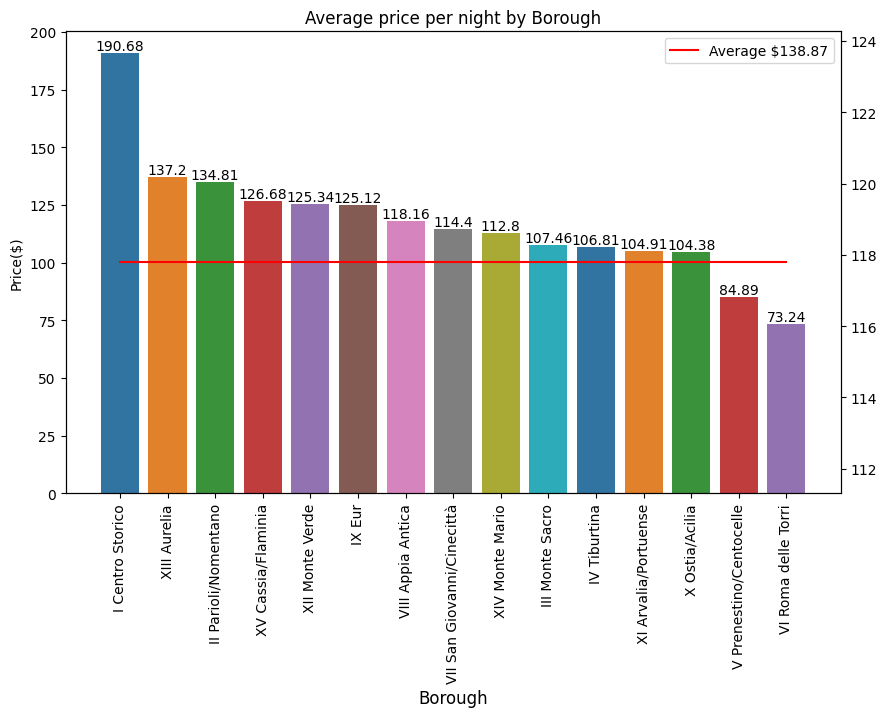

In [69]:
fig=plt.figure(figsize=(10,6))
ax1=sns.barplot(x="neighbourhood",y="price",hue="neighbourhood",palette="tab10",data=boroughs)
for bars in ax1.containers:
    ax1.bar_label(bars)
plt.xticks(rotation=90,size=10)
plt.xlabel("Borough",fontsize=12)
plt.ylabel("Price($)")
mean_borough=boroughs.price.mean().round(2)
ax2=ax1.twinx()
ax2=sns.lineplot(x="neighbourhood",y=mean_borough,data=boroughs,label="Average $138.87",color="r")
plt.title("Average price per night by Borough")
plt.show()

#### 3.6 List the top Hosts in Rome city based on Score

In [70]:
airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_month,price_category
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0,1216.67,Budget
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0,3650.00,Budget
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0,2585.42,Budget
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0,2585.42,Budget
5,2023-12-15,2023,77831,41.897330,12.491700,Nathalie,I Centro Storico,Entire home/apt,3,4.89,310,110.0,3345.83,Budget
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0,7786.67,Expensive
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0,12166.67,Expensive
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0,1520.83,Budget
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0,3954.17,Budget


Im going to categorize each host based on its score review

- Low Score: 0 - 2.4
- Standard: 2.5 - 4.0
- High Score: 4.1 - 5.0

In [71]:
label_names=["Low Score","Standard","High Score"]
score_ranges=[-np.inf,2.4,4.0,5]

airbnb["score rank"]=pd.cut(airbnb["Global Score"],bins=score_ranges,labels=label_names)
airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_month,price_category,score rank
0,2023-12-15,2023,2737,41.871360,12.482150,Elif,VIII Appia Antica,Private room,7,4.66,5,40.0,1216.67,Budget,High Score
1,2023-12-16,2023,3079,41.895000,12.491170,Laura,I Centro Storico,Entire home/apt,30,4.62,21,120.0,3650.00,Budget,High Score
2,2023-12-15,2023,11834,41.895447,12.491181,Serena,I Centro Storico,Entire home/apt,2,4.89,220,85.0,2585.42,Budget,High Score
4,2023-12-15,2023,12398,41.925820,12.469280,Gea,II Parioli/Nomentano,Entire home/apt,1,4.92,66,85.0,2585.42,Budget,High Score
5,2023-12-15,2023,77831,41.897330,12.491700,Nathalie,I Centro Storico,Entire home/apt,3,4.89,310,110.0,3345.83,Budget,High Score
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29352,2023-12-15,2023,1045686898188445060,41.876260,12.487310,Matteo,I Centro Storico,Entire home/apt,1,0.00,0,256.0,7786.67,Expensive,Low Score
29353,2023-12-15,2023,1045689020966629799,41.910167,12.454710,Alessandro,I Centro Storico,Entire home/apt,2,0.00,0,400.0,12166.67,Expensive,Low Score
29354,2023-12-16,2023,1045768413893531664,41.874580,12.480660,Malina Maria,VIII Appia Antica,Private room,1,0.00,0,50.0,1520.83,Budget,Low Score
29355,2023-12-16,2023,1046232189823053817,41.888906,12.472013,Weekey,I Centro Storico,Entire home/apt,1,0.00,0,130.0,3954.17,Budget,Low Score


In [72]:
score_rank=airbnb.groupby(["score rank"],as_index=False)["id"].count().rename(columns=({"id":"total"}))
score_rank

,score rank,total
0,Low Score,4168
1,Standard,564
2,High Score,24235


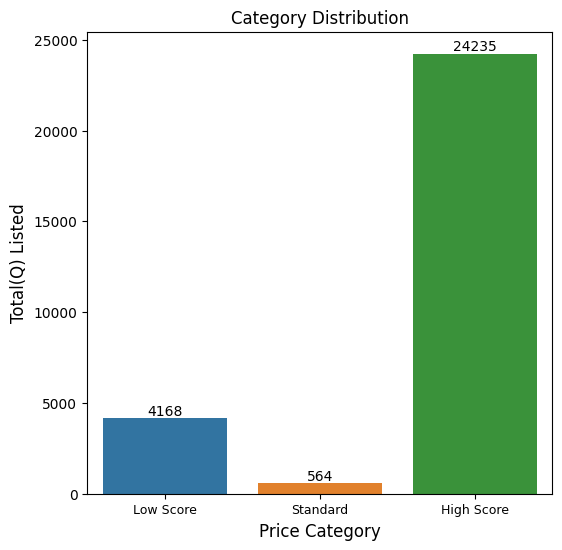

In [73]:
plt.figure(figsize=(6,6))
ax=sns.barplot(x="score rank",y="total",data=score_rank,hue="score rank",legend=False)
for bars in ax.containers:
    ax.bar_label(bars)
plt.title("Category Distribution")
plt.xlabel("Price Category",fontsize=12)
plt.ylabel("Total(Q) Listed",fontsize=12)
plt.xticks(rotation=0,size=9)
plt.show()

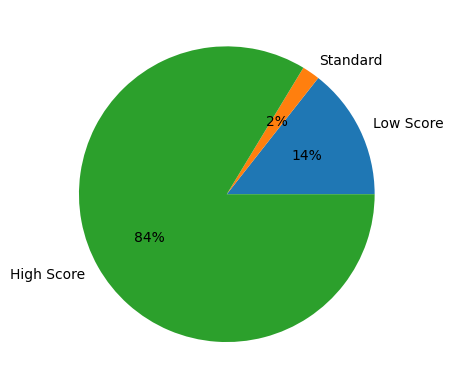

In [74]:
data=score_rank.total
labels_pie=score_rank["score rank"]

plt.pie(data,labels=labels_pie,colors=sns.color_palette("tab10"),autopct='%.0f%%')
plt.show()

For the total Airbnb's listed in Rome, 84% travelers gave them a High Score.

That means Romans hosts are doing great providing good accommodations meeting the demand requirements.

In [75]:
# 2023 Top 10 Rome Airbnb Hosts

top_hosts=airbnb.groupby(["host_name","number_of_reviews"],as_index=False)["Global Score"].max().sort_values(["Global Score","number_of_reviews"],ascending=[False,False])
top_hosts

,host_name,number_of_reviews,Global Score
5670,Erika,87,5.0
15648,Roberta,73,5.0
4854,EasyDomus,61,5.0
5698,Erminia,58,5.0
4418,Davide,53,5.0
...,...,...,...
19099,敬明,0,0.0
19104,旭楠,0,0.0
19105,王瑞 Rui W Ang,0,0.0
19117,紫桐,0,0.0


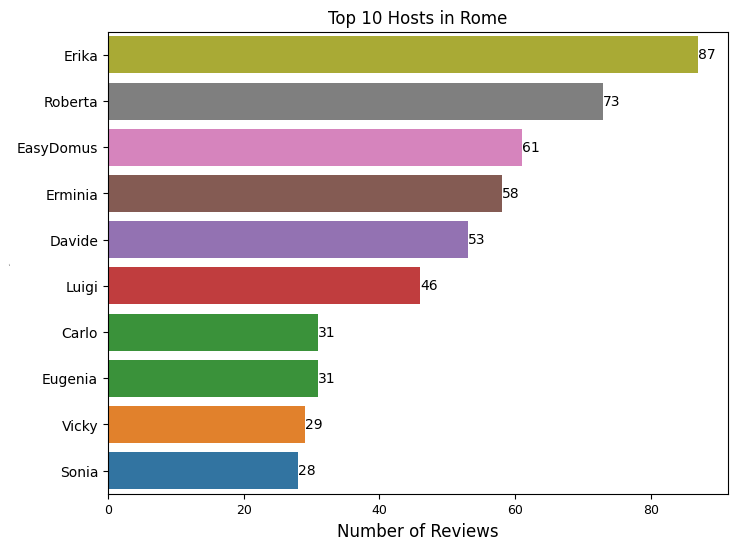

In [76]:
plt.figure(figsize=(8,6))
ax=sns.barplot(x="number_of_reviews",y="host_name",data=top_hosts[:10],palette="tab10",hue="number_of_reviews",legend=False)
for bars in ax.containers:
    ax.bar_label(bars)
plt.title("Top 10 Hosts in Rome")
plt.xlabel("Number of Reviews",fontsize=12)
plt.ylabel("Host",fontsize=0)
plt.xticks(rotation=0,size=9)
plt.show()

The above output gives us the top 10 Hosts based on its score and most importantly the number of reviews, 

the higher the number of reviews the more accurate is the final score received

#### 3.7 Mapping the accommodations across the City

In [77]:
# Maping Rome

Rome Coordinates

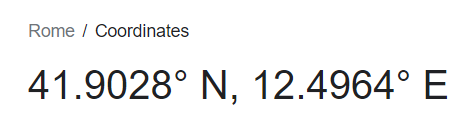

In [78]:
latitude=41.9025
longitude=12.4964

In [79]:
import folium

In [80]:
rome_map=folium.Map(location=[latitude,longitude],zoom_start=12)

In [81]:
rome_map

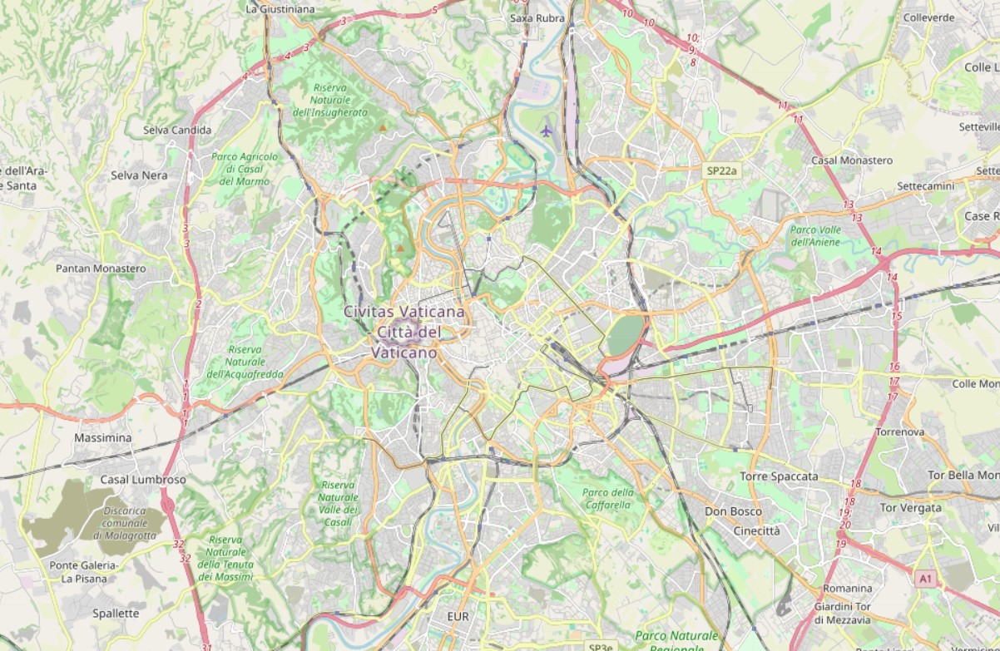

### For the pourpose of the excercise im going to map just the 10% of the accommodations

In [224]:
partial_airbnb=airbnb.sample(frac=0.1)
partial_airbnb

,last_scraped,year,id,latitude,longitude,host_name,neighbourhood,room_type,minimum_nights,Global Score,number_of_reviews,price,price_month,price_category,score rank
9737,2023-12-15,2023,28706146,41.897900,12.471520,Giorgio,I Centro Storico,Entire home/apt,3,4.81,92,60.0,1825.00,Budget,High Score
21356,2023-12-15,2023,776658538223632151,41.896453,12.492019,Fabrizio,I Centro Storico,Entire home/apt,1,4.83,39,200.0,6083.33,Expensive,High Score
22527,2023-12-15,2023,834610651960401731,41.807589,12.614354,Andrea,VII San Giovanni/Cinecittà,Private room,1,4.43,2,90.0,2737.50,Budget,High Score
14327,2023-12-15,2023,44605809,41.910420,12.476650,Iris - BELVILLA,I Centro Storico,Entire home/apt,1,0.00,0,194.0,5900.83,Expensive,Low Score
15237,2023-12-16,2023,48823527,41.930670,12.516890,Luca,II Parioli/Nomentano,Private room,1,0.00,0,27.0,821.25,Budget,Low Score
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4263,2023-12-15,2023,9936759,41.817370,12.614880,Rita,VII San Giovanni/Cinecittà,Entire home/apt,2,0.00,0,45.0,1368.75,Budget,Low Score
25821,2023-12-15,2023,941670200663800242,41.851540,12.490510,Alessandro,VIII Appia Antica,Private room,2,4.57,1,120.0,3650.00,Budget,High Score
19000,2023-12-15,2023,647247561466550435,41.821909,12.449362,Andrea,IX Eur,Entire home/apt,1,4.85,30,150.0,4562.50,Budget,High Score
21307,2023-12-16,2023,772968658797017182,41.854345,12.473502,Simona,VIII Appia Antica,Entire home/apt,2,4.84,47,75.0,2281.25,Budget,High Score


In [111]:
import folium

In [112]:
latitude=41.9028
longitude=12.4964

In [226]:
rome_map=folium.Map(location=[latitude,longitude],zoom_start=12)

In [227]:
accommodations = folium.FeatureGroup()
for lat, lng in zip(partial_airbnb["latitude"], partial_airbnb["longitude"]):
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='yellow',
        fill=True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(accommodations)

In [228]:
rome_map.add_child(accommodations)

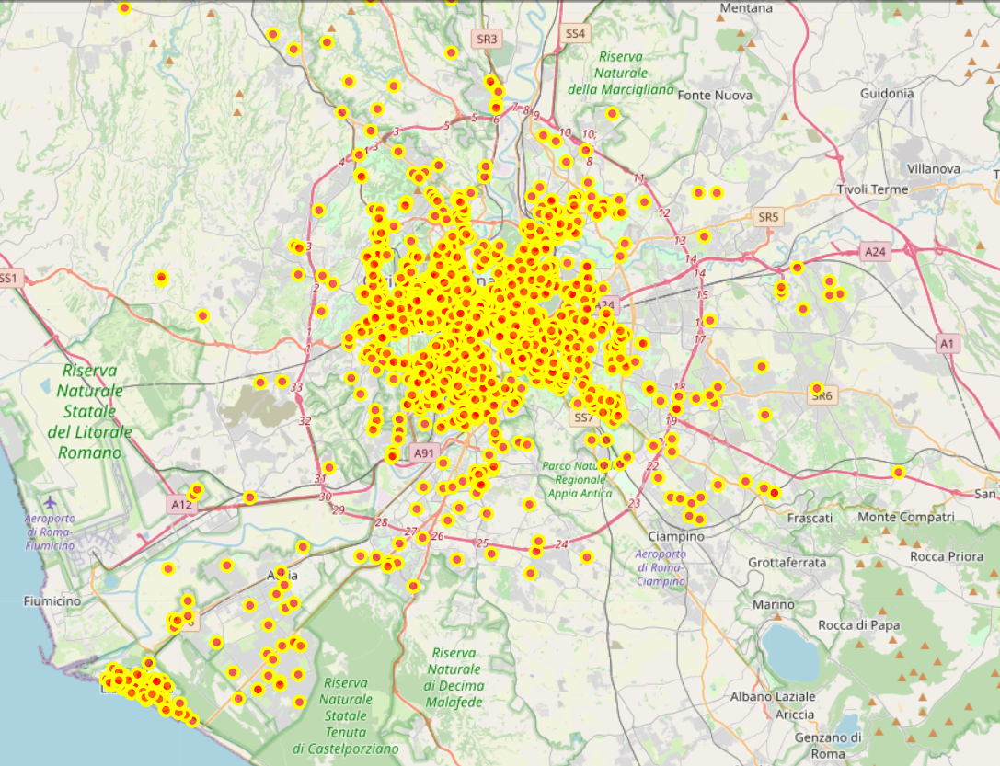

In [184]:
from folium import plugins

In [229]:
rome_map = folium.Map(location = [latitude, longitude], zoom_start = 12)
accommodations = plugins.MarkerCluster().add_to(rome_map)
for lat, lng, label, in zip(partial_airbnb["latitude"], partial_airbnb["longitude"], partial_airbnb["room_type"]):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(accommodations)

In [230]:
# Show Map
rome_map

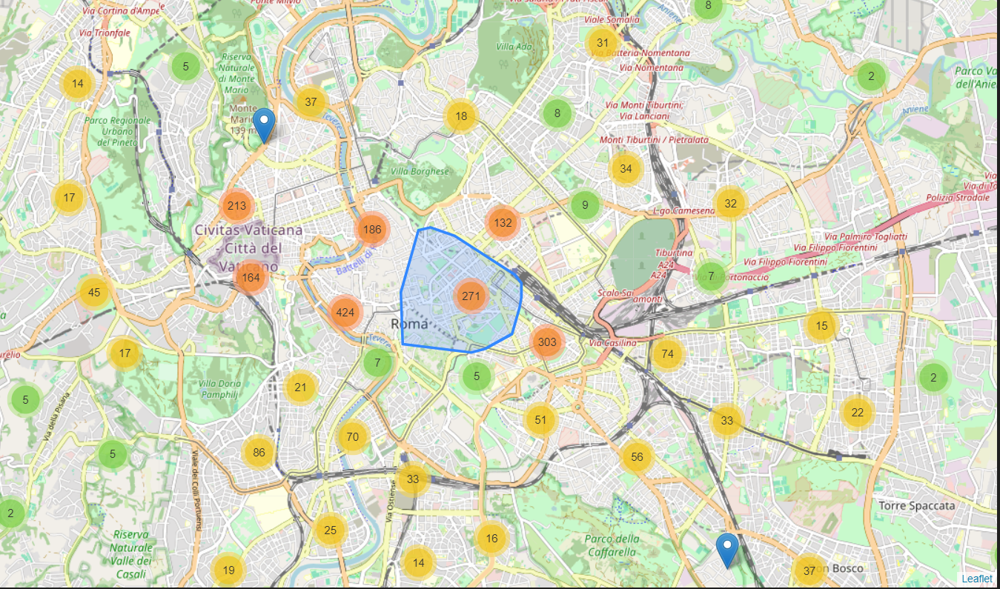

#### 3.7 Extract the key topics from score reviews posted by travelers.

- To extract the key topics im going to extract the key topics in English

In [231]:
reviews=df_reviews.copy()

In [264]:
# Importing Libraries

import string
import nltk
import yake
import wordcloud
from nltk.corpus import stopwords
nltk.download("stopwords")
import wordcloud
from wordcloud import WordCloud
from langdetect import detect, LangDetectException

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\diazc\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [232]:
reviews

,id,date,comments
0,2737,2014-12-26,"This spot was in a great and nice area,walking..."
1,2737,2015-01-04,"Elif was really very helpful, while arranging ..."
2,2737,2015-04-12,"Elif's flat is spacious, clean, and had everyt..."
3,2737,2015-04-22,I had a wonderful time staying with Elif and h...
4,2737,2015-05-08,"Elif was a brilliant host, with an exceptional..."
...,...,...,...
1621357,1039095596324553445,2023-12-11,Ottimo
1621358,1039214207343958639,2023-12-13,"Paola è un host gentile e presente, disponibil..."
1621359,1039631900251985277,2023-12-11,"My mom and I booked this on a last minute, une..."
1621360,1039728330307491083,2023-12-09,Satisfied costumer here! if we can give more t...


In [235]:
# Filtering comments by year 2023

filter=reviews["date"].dt.year==2023
reviews=reviews[filter]

In [242]:
reviews

,id,date,comments
438,11834,2023-02-22,Perfect and adorable place! <br/>Our host is a...
439,11834,2023-02-26,We really enjoyed our stay at Serena’s place. ...
440,11834,2023-03-22,In the heart of Monti. Very lively neighborhoo...
441,11834,2023-03-26,I had such a lovely stay in Serena's studio. W...
442,11834,2023-03-30,"We had a wonderful stay at Serena’s place, tha..."
...,...,...,...
1621357,1039095596324553445,2023-12-11,Ottimo
1621358,1039214207343958639,2023-12-13,"Paola è un host gentile e presente, disponibil..."
1621359,1039631900251985277,2023-12-11,"My mom and I booked this on a last minute, une..."
1621360,1039728330307491083,2023-12-09,Satisfied costumer here! if we can give more t...


In [243]:
# Step 1: Casting comments lo lower

reviews["comments"]=reviews["comments"].str.lower()
reviews

,id,date,comments
438,11834,2023-02-22,perfect and adorable place! <br/>our host is a...
439,11834,2023-02-26,we really enjoyed our stay at serena’s place. ...
440,11834,2023-03-22,in the heart of monti. very lively neighborhoo...
441,11834,2023-03-26,i had such a lovely stay in serena's studio. w...
442,11834,2023-03-30,"we had a wonderful stay at serena’s place, tha..."
...,...,...,...
1621357,1039095596324553445,2023-12-11,ottimo
1621358,1039214207343958639,2023-12-13,"paola è un host gentile e presente, disponibil..."
1621359,1039631900251985277,2023-12-11,"my mom and i booked this on a last minute, une..."
1621360,1039728330307491083,2023-12-09,satisfied costumer here! if we can give more t...


In [245]:
# Step 2: Removing punctuation and digits

exclist=string.punctuation+string.digits
exclist

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~0123456789'

In [246]:
# Applying the exclution list

for i in exclist:
   reviews["comments"]=reviews["comments"].str.replace(i,"")

In [247]:
reviews

,id,date,comments
438,11834,2023-02-22,perfect and adorable place brour host is avail...
439,11834,2023-02-26,we really enjoyed our stay at serena’s place i...
440,11834,2023-03-22,in the heart of monti very lively neighborhood...
441,11834,2023-03-26,i had such a lovely stay in serenas studio whe...
442,11834,2023-03-30,we had a wonderful stay at serena’s place than...
...,...,...,...
1621357,1039095596324553445,2023-12-11,ottimo
1621358,1039214207343958639,2023-12-13,paola è un host gentile e presente disponibili...
1621359,1039631900251985277,2023-12-11,my mom and i booked this on a last minute unex...
1621360,1039728330307491083,2023-12-09,satisfied costumer here if we can give more th...


In [249]:
# Detecting language for each comment

def f(x):
    try:
        result = detect(str(x))
    except LangDetectException as e:
        result = str(e)
    return result

In [250]:
reviews["language"] = reviews["comments"].apply(f)

In [252]:
language_reviews=reviews.copy()

In [253]:
language_reviews

,id,date,comments,language
438,11834,2023-02-22,perfect and adorable place brour host is avail...,en
439,11834,2023-02-26,we really enjoyed our stay at serena’s place i...,en
440,11834,2023-03-22,in the heart of monti very lively neighborhood...,en
441,11834,2023-03-26,i had such a lovely stay in serenas studio whe...,en
442,11834,2023-03-30,we had a wonderful stay at serena’s place than...,en
...,...,...,...,...
1621357,1039095596324553445,2023-12-11,ottimo,it
1621358,1039214207343958639,2023-12-13,paola è un host gentile e presente disponibili...,it
1621359,1039631900251985277,2023-12-11,my mom and i booked this on a last minute unex...,en
1621360,1039728330307491083,2023-12-09,satisfied costumer here if we can give more th...,en


In [274]:
# Exporting table

#language_reviews.to_csv("language_reviews.csv")

In [255]:
# Filtering by english language

filter=language_reviews["language"]=="en"
english_reviews=language_reviews[filter]

In [258]:
# Step 3: Apply Stop Words in comments

stop_words=stopwords.words("english")
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

In [259]:
# Creating a personalized stopwords list that I know will disrupt the extraction of the Key Words

my_stopwords=["apartment","rome","place","stay"]
stop_words.extend(my_stopwords)

In [260]:
# Checking if addition of my_stopwords is succesfully

"rome" in stop_words

True

In [261]:
english_reviews['stopwords'] =english_reviews['comments'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stop_words)]))

In [262]:
english_reviews

,id,date,comments,language,stopwords
438,11834,2023-02-22,perfect and adorable place brour host is avail...,en,perfect adorable brour host available full nic...
439,11834,2023-02-26,we really enjoyed our stay at serena’s place i...,en,really enjoyed serena’s right center less min ...
440,11834,2023-03-22,in the heart of monti very lively neighborhood...,en,heart monti lively neighborhood walkable many ...
441,11834,2023-03-26,i had such a lovely stay in serenas studio whe...,en,lovely serenas studio arrived met serena frien...
442,11834,2023-03-30,we had a wonderful stay at serena’s place than...,en,wonderful serena’s thanks welcoming thoughtful...
...,...,...,...,...,...
1621342,1038924146893342907,2023-12-10,everything was great amazing mandarin tree in...,en,everything great amazing mandarin tree garden
1621348,1036207080879862990,2023-12-06,beautiful spacious and super welcoming house o...,en,beautiful spacious super welcoming house level...
1621351,1036207080879862990,2023-12-11,everything was very wonderful i highly recomme...,en,everything wonderful highly recommend 🙏🫶🏻
1621359,1039631900251985277,2023-12-11,my mom and i booked this on a last minute unex...,en,mom booked last minute unexpected day trip mos...


In [275]:
# Exporting Table

#english_reviews.to_csv("englishstopwords.csv")

In [263]:
# Step 4: Extract Keywords (three Key Words)

language = 'en'
max_ngram_size = 3
deduplication_threshold = 0.9
numOfKeywords = 3
custom_kw_extractor = yake.KeywordExtractor(lan=language, n=max_ngram_size,dedupLim=deduplication_threshold,top=numOfKeywords, features=None)
extract_keywords = lambda x: ",".join(k[0] for k in custom_kw_extractor.extract_keywords(x))
english_reviews['keywords'] = english_reviews['stopwords'].apply(extract_keywords)

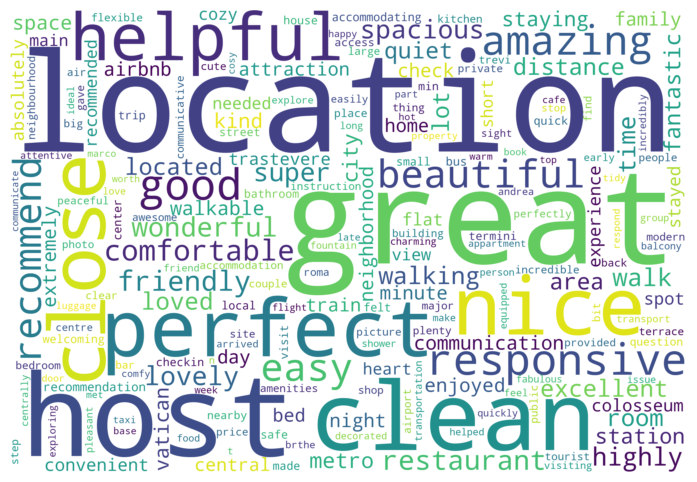

In [267]:
# Step 5: Create the Word Cloud

text=",".join(comment for comment in english_reviews.keywords)
my_wordcloud= WordCloud(collocations = False, background_color = 'white',width = 3048, height = 2080).generate(text)
plt.figure(figsize=(10,6))
plt.imshow(my_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Extracting the key words out of each english comment in each airbnb accommodations I can say:

1. Locations is perhaps the most relevant feature for travelers could be perhaps location close to metro stations or close to the city center

2. There are many qualities to mention such as: Cleanliness, excellent, amazing fantastic etc. 

Hosties in Rome are doing a good job by satisfying the travelers needs.

### 4. Conclutions!

1. Rome offers 28.967 accomodations for travelers.

2. The average rate per night to stay in Rome is $156 Euros.

3. When casting the night rate per month the average cost is 4.736,00 EUR which compared for one bedroom apartment in Rome is 1.650 EUR [Link](https://housinganywhere.com/Rome--Italy/cost-of-living-rome)

- Here is important to note or stress that the growing popularity could be a threat for local rental market, as owners will get a higher profits on Airbnb platform. This could bring consequences for locals as they could be displaced out of their neighbourhoods. No wonder why cities like New York have implemented thought rules and other cities such as Dallas, Quebec, Memphis and San Francisco taking action to regulate short-term rentals. [The end of Airbnb in New York](https://www.wired.com/story/airbnb-ban-new-york-city/)

4. From the total 28.967 Airbnb listings in Rome, 70% from the category "Entire home/apt" dominates the market share.

5. The priciest neighbourhoods for a single night are: "Centro Storico, Eur and Parioli" out the whole fifteen Rome neighbourhoods.

6. Romans are doing great by satisfying the needs for travelers giving a high score to 84% accommodations. 

7. In 2023 there were 455.653 comments and reviews. After applying language detection using Python for English language, I can point out that location and cleanliness are top requirements for travelers.